In [1]:
# import resources
%matplotlib inline

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

In [2]:
model = models.vgg16(pretrained = True).features
for param in model.parameters():
    param.requires_grad_(False)

C:\Users\imane\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\imane\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [3]:
def load_img(img_path, max_size = 400, shape = None):
    
    image = Image.open(img_path).convert("RGB")
    
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
        
    if shape is not None:
        size = shape
        
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), 
                             (0.229, 0.224, 0.225))])
    image = transform(image).unsqueeze(0)
    
    return image

In [4]:
def im_convert(tensor):
    
    image = tensor.clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

In [5]:
def get_features(image, model, layers=None):

    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': "conv2_1",
                  '10': "conv3_1",
                  '19': "conv4_1",
                  '21': "conv4_2",
                  "28": 'conv5_1'}
        

    features = {}
    x = image

    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

In [6]:
def gram_matrix(tensor):
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h*w)
    gram = torch.mm(tensor, tensor.t())
    return gram

In [7]:
style_weights = {"conv1_1": 1.,
                  "conv2_1": 0.8,
                  "conv3_1": 0.5,
                  "conv4_1": 0.3,
                  "conv5_1": 0.1}
content_weight = 1
style_weight = 1e6

In [9]:
portrait = load_img(r'C:\Users\imane\OneDrive\Desktop\style_transfer\portait.jpg')
painting = load_img(r'C:\Users\imane\OneDrive\Desktop\style_transfer\painting.jpg', shape = portrait.shape[2:])

In [10]:
portrait.size()

torch.Size([1, 3, 400, 400])

In [11]:
painting.size()

torch.Size([1, 3, 400, 400])

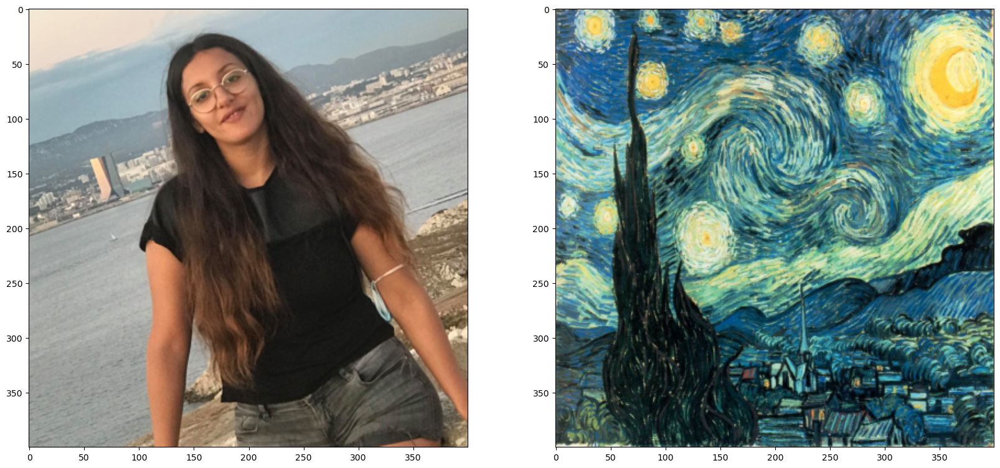

In [12]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))
ax1.imshow(im_convert(portrait))
ax2.imshow(im_convert(painting))

In [13]:
portrait_features = get_features(portrait, model)
painting_features = get_features(painting, model)
painting_grams = {layer : gram_matrix(painting_features[layer]) for layer in painting_features}
target_2 = portrait.clone().requires_grad_(True)

Total loss 5586730.5


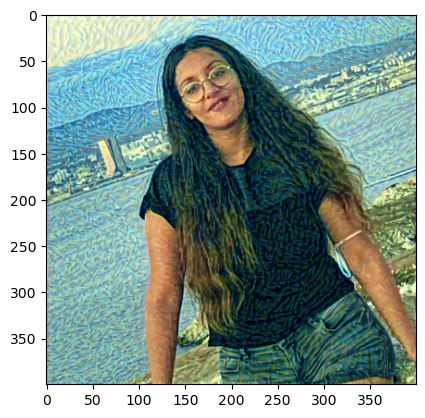

Total loss 2238465.25


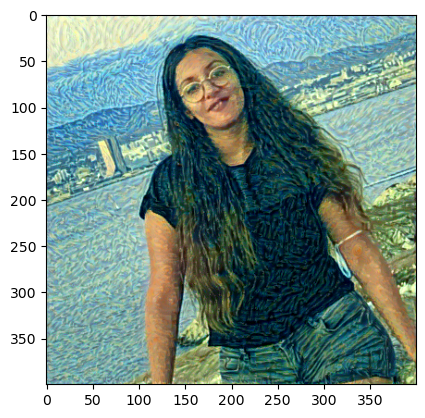

Total loss 1271892.0


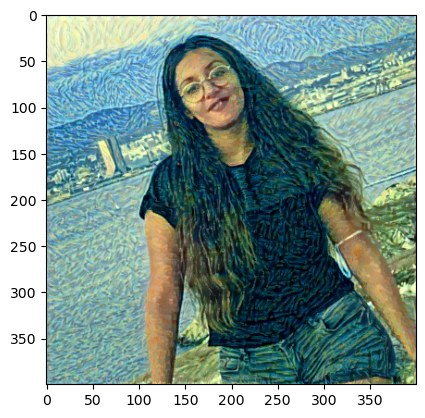

Total loss 845192.9375


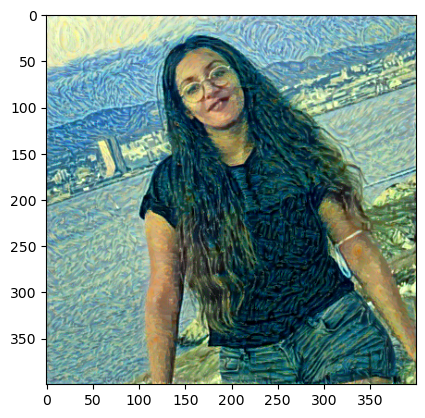

Total loss 593638.1875


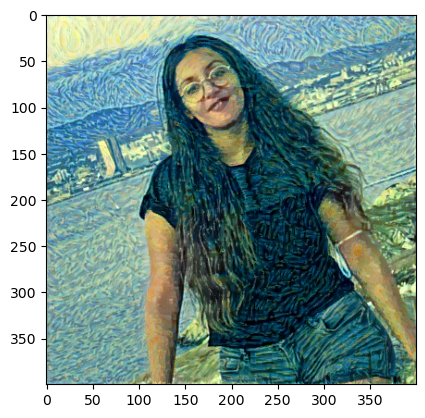

Total loss 428104.3125


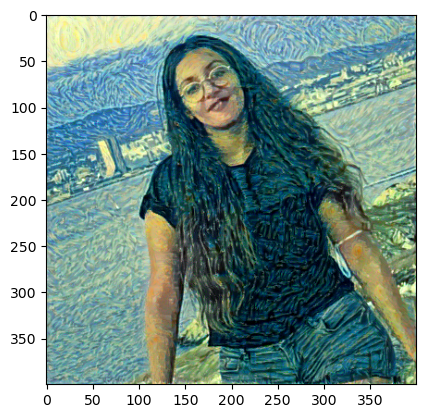

Total loss 315476.625


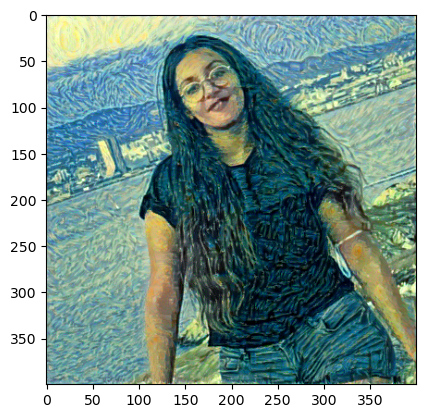

Total loss 237389.546875


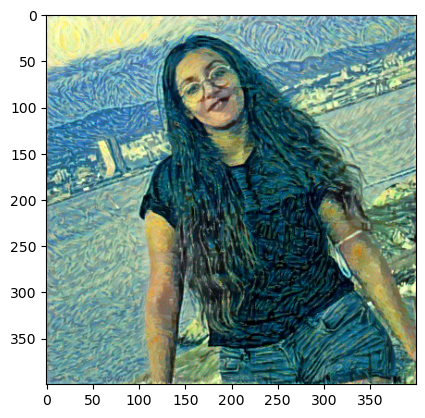

Total loss 182501.46875


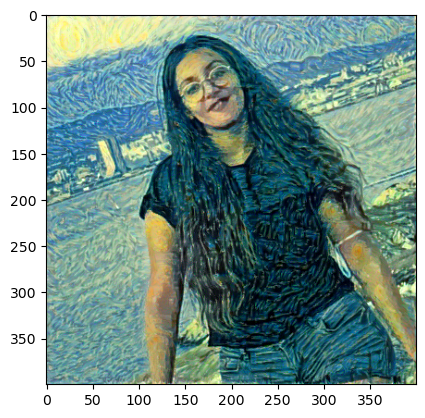

Total loss 143524.5


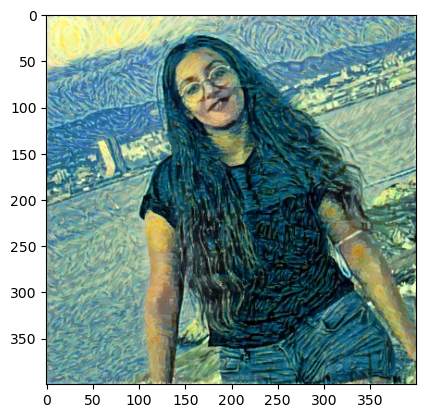

Total loss 115338.328125


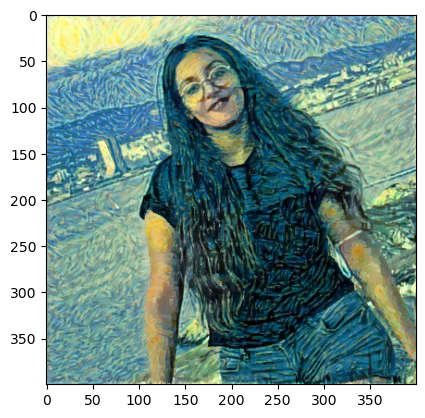

Total loss 94553.953125


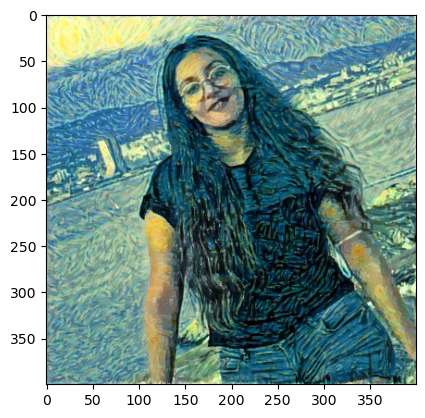

Total loss 78885.640625


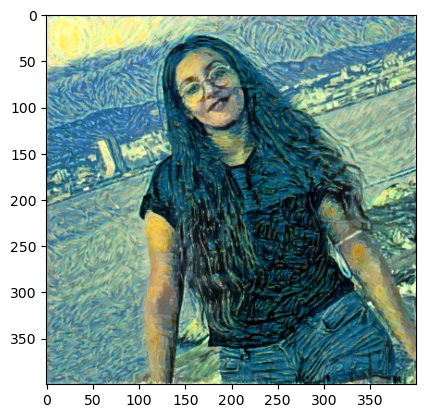

Total loss 66750.984375


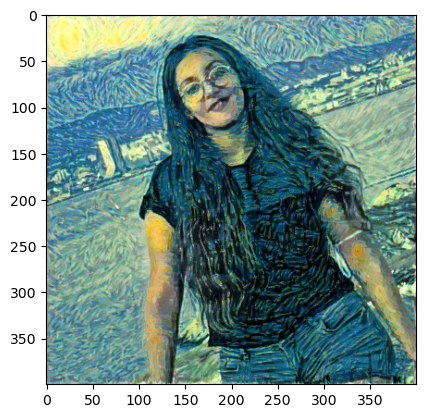

Total loss 57094.21484375


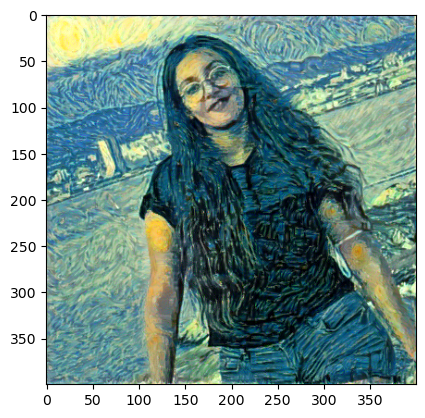

In [14]:
show_every = 400
steps = 6000
optimizer = optim.Adam([target_2], lr= 0.005)
for step in range(1, steps+1):
    target_features = get_features(target_2, model)
    content_loss = torch.mean((target_features["conv4_2"] - portrait_features["conv4_2"])**2)
    
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        _, d, h, w = target_feature.size()
        
        target_gram = gram_matrix(target_feature)
        style_gram = painting_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        
        style_loss += layer_style_loss /(d*h*w)
    
    total_loss = (content_weight* content_loss) + (style_weight* style_loss)
    
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if step % show_every == 0:
        print("Total loss", total_loss.item())
        plt.imshow(im_convert(target_2))
        plt.show()

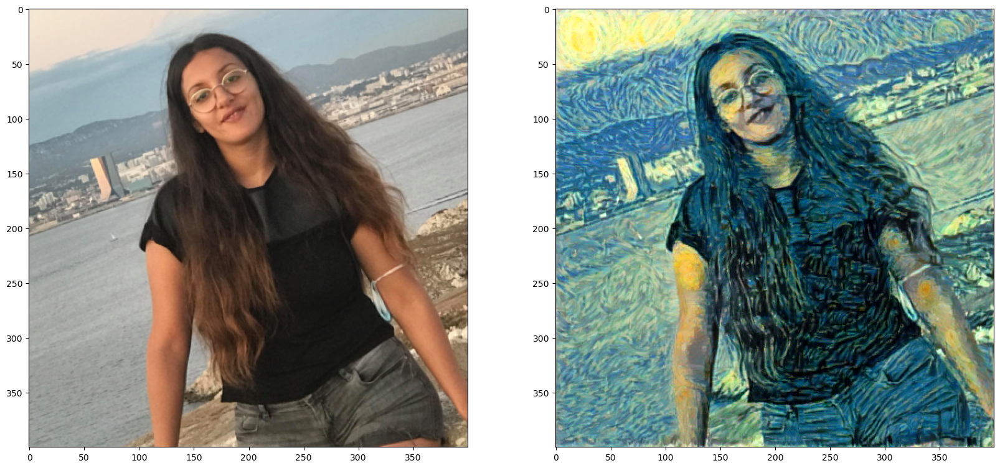

In [15]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(portrait))
ax2.imshow(im_convert(target_2))